In [1]:
import turicreate as tc
img_folder = 'data'

In [2]:
#load image, if errors, files will be skipped
data = tc.image_analysis.load_images(img_folder, with_path=True)

Unexpected JPEG decode failure	 file: /home/jonathan/Desktop/MakeupOrNoMakeup/data/no_makeup/3280.jpg

Unexpected JPEG decode failure	 file: /home/jonathan/Desktop/MakeupOrNoMakeup/data/no_makeup/87232136_2880169575360071_1798872882638650715_n.jpg

Read 1134 images in 5.00218 secs	speed: 226.701 file/sec

Unexpected JPEG decode failure	 file: /home/jonathan/Desktop/MakeupOrNoMakeup/data/no_makeup/Main_05002107-d1bf-4d08-9fe6-0a3a2579e8e0_1024x1024.jpg

Unexpected JPEG decode failure	 file: /home/jonathan/Desktop/MakeupOrNoMakeup/data/no_makeup/beauty-2014-11-natural-makeup-how-to-main.jpg

Unexpected JPEG decode failure	 file: /home/jonathan/Desktop/MakeupOrNoMakeup/data/no_makeup/young-smiling-woman-beautiful-face-260nw-749164483.jpg

In [3]:
#label makeup and no makeup
data['label'] = data['path'].apply(lambda path:'makeup' if '/makeup' in path else 'no_makeup')

/home/jonathan/.local/lib/python3.6/site-packages/turicreate/visualization/_plot.py:461: UserWarning: Displaying only the first 100 rows.
  warnings.warn("Displaying only the first {} rows.".format(maximum_rows))


,path,image,label
0,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/0000-ortalelimeleh1.jpg,,makeup
1,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/01f936a335e21c8e6bb8dfb3a203c3b8.jpg,,makeup
2,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/05bb5fee5930c00d03a8e0886e7dfdcf.jpg,,makeup
3,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/060290e8f987ddbf26d47dbb34f644c5.jpg,,makeup
4,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/06e7ba700c97e88b9c75e923e15e6892.jpg,,makeup
5,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/0a6d65ea3d955b8a609bc5a23cd27dec.jpg,,makeup
6,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/0b8ede74a9977af55ffc38ef2d05ce3a.jpg,,makeup
7,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/1-2.jpg,,makeup
8,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/112e16b2ce49f0c1990562b20033c12d.jpg,,makeup
9,/home/jonathan/Desktop/MakeupOrNoMakeup/data/makeup/21-Best-Natural-Makeup-Ideas-for-all-Season-and-Event (10).PNG,,makeup

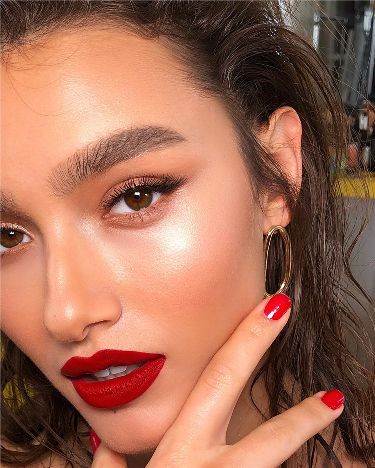
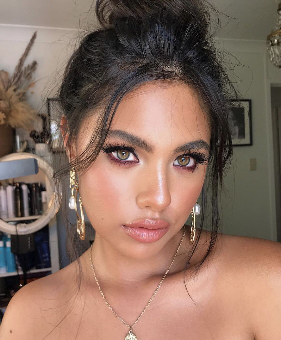
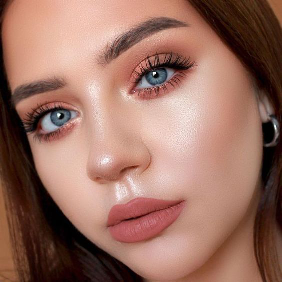
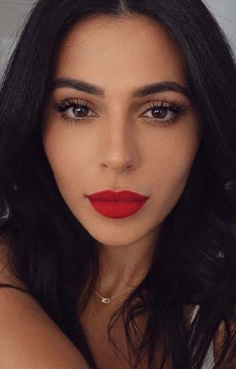
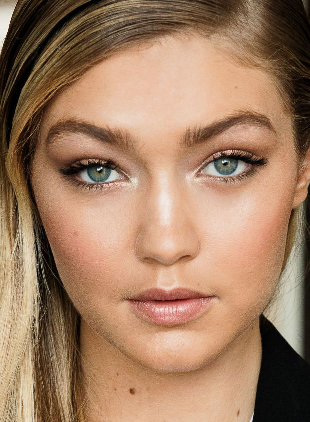
...
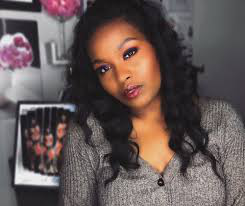
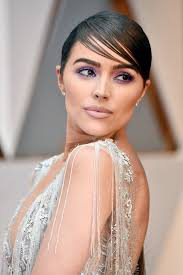
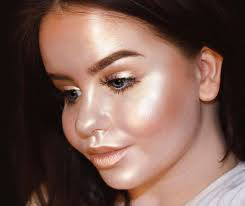
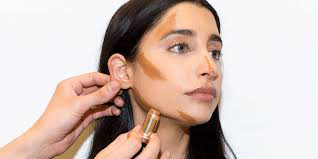
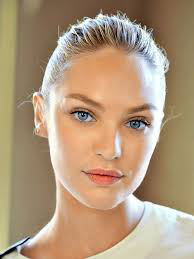

In [4]:
#take a look at the data
data.explore()

In [5]:
#save the frame
data.save('test2.sframe')

In [6]:
#load the frame
data = tc.SFrame('test2.sframe')

In [7]:
#make a train-test split
train_data, test_data = data.random_split(0.8)

In [8]:
#create model
model = tc.image_classifier.create(train_data, target='label')

Instructions for updating:
non-resource variables are not supported in the long term
Performing feature extraction on resized images...
Completed   64/1326
Completed  128/1326
Completed  192/1326
Completed  256/1326
Completed  320/1326
Completed  384/1326
Completed  448/1326
Completed  512/1326
Completed  576/1326
Completed  640/1326
Completed  704/1326
Completed  768/1326
Completed  832/1326
Completed  896/1326
Completed  960/1326
Completed 1024/1326
Completed 1088/1326
Completed 1152/1326
Completed 1216/1326
Completed 1280/1326
Completed 1326/1326
PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Logistic regression:

--------------------------------------------------------

Number of examples          : 1259

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 2048

Number of coefficients      : 2049

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 5        | 0.028033  | 1.308617     | 0.533757          | 0.582090            |

| 1         | 10       | 2.382801  | 1.642318     | 0.811755          | 0.731343            |

| 2         | 15       | 2.268902  | 1.973224     | 0.807784          | 0.716418            |

| 3         | 16       | 2.268902  | 2.093569     | 0.830818          | 0.731343            |

| 4         | 17       | 2.268902  | 2.223406     | 0.872915          | 0.835821            |

| 9         | 24       | 1.732202  | 2.907566     | 0.936458          | 0.805970            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

In [9]:
# save predictions to an Sarray
predictions = model.predict(test_data)

In [10]:
metrics = model.evaluate(test_data)
print(metrics)

Performing feature extraction on resized images...
Completed  64/310
Completed 128/310
Completed 192/310
Completed 256/310
Completed 310/310
{'accuracy': 0.8290322580645161, 'f1_score': 0.8427299703264094, 'log_loss': 0.46988292607114623, 'precision': 0.8304093567251462, 'recall': 0.8554216867469879, 'auc': 0.9240922021419002, 'roc_curve': Columns:
	threshold	float
	fpr	float
	tpr	float
	p	int
	n	int

Rows: 100001

Data:
+-----------+--------------------+--------------------+-----+-----+
| threshold |        fpr         |        tpr         |  p  |  n  |
+-----------+--------------------+--------------------+-----+-----+
|    0.0    |        1.0         |        1.0         | 166 | 144 |
|   1e-05   | 0.8958333333333334 | 0.9939759036144579 | 166 | 144 |
|   2e-05   | 0.8541666666666666 | 0.9939759036144579 | 166 | 144 |
|   3e-05   | 0.8472222222222222 | 0.9939759036144579 | 166 | 144 |
|   4e-05   | 0.8402777777777778 | 0.9939759036144579 | 166 | 144 |
|   5e-05   | 0.833333333333333

In [11]:
#save the model
model.save('test2.model')

In [72]:
test_folder = 'data/not_tested/'

In [73]:
unpredict = tc.image_analysis.load_images(test_folder, with_path=True)

In [74]:
unpredict.save('unpredict.sframe')

In [48]:
seconds_test = tc.SFrame('unpredict.sframe')

,path,image
0,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/0r89308op8134025oppqpnqr129s9n15.jpg,
1,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/158o87n3311n40948r90s61s98pspq52.jpg,
2,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/167s000254395srr438r.jpg,
3,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/20190417_EN_SHUHUA_2.jpg,
4,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/2577fdd61b5f84c0b7cc8cedfb6256c3.jpg,
5,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/304c4e63545043306631.jpg,
6,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/3b6c32d4ced01281e282ecfaf61ab133.jpg,
7,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/413518b9096404a9f61d6feae6e39fa3.jpg,
8,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/59a0583f1ff16667c0d4fc1c61084635.jpg,
9,/home/jonathan/Desktop/MakeupOrNoMakeup/data/not_tested/5d5966015109de60cb98d2365be34c92.jpg,

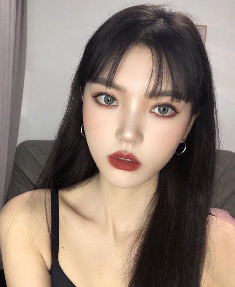
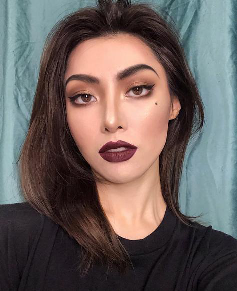
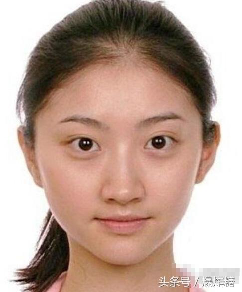
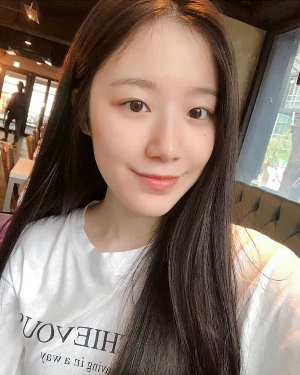
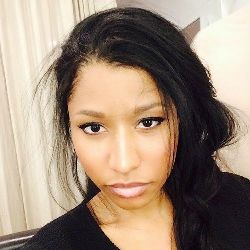
...
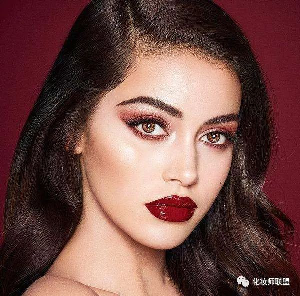
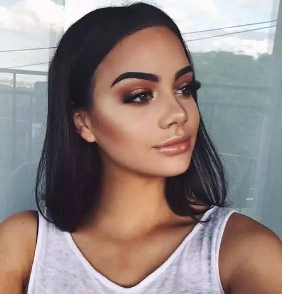
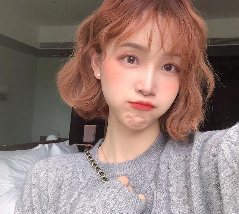
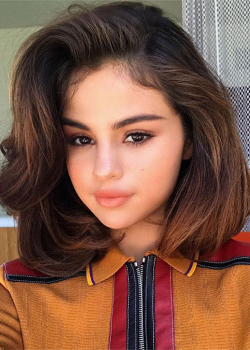
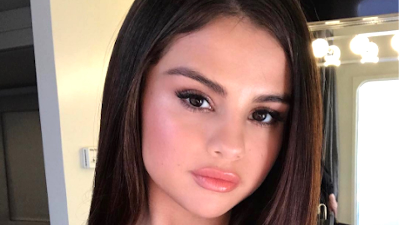

In [75]:
seconds_test.explore()

In [76]:
test_data = seconds_test

In [77]:
result = model.predict(test_data)

In [84]:
result.explore()

,SArray
0,no_makeup
1,makeup
2,no_makeup
3,no_makeup
4,no_makeup
5,no_makeup
6,no_makeup
7,no_makeup
8,no_makeup
9,makeup
